In [4]:
from torch.utils.data import Dataset, DataLoader
import glob
import cv2
import numpy as np

class PineappleDataset(Dataset):
    def __init__(self, train=True, train_ratio=0.8):
        # Get all images sorted from the specified folder.
        self.all_images = sorted(glob.glob("./FULL_VERTICAL_PINEAPPLE/FULL_UNIFIED/*"))
        # Calculate the index at which to split the dataset.
        split_index = int(len(self.all_images) * train_ratio)
        # Partition the images based on the 'train' flag.
        if train:
            self.images = self.all_images[:split_index]
        else:
            self.images = self.all_images[split_index:]
        self.resize_shape = (256, 256)

    def __len__(self):
        return len(self.images)

    def transform_image(self, image_path):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        channels = 3
        # Resize the image.
        image = cv2.resize(image, dsize=(self.resize_shape[1], self.resize_shape[0]))
        # Convert to float32 and normalize.
        image = np.array(image).reshape((image.shape[0], image.shape[1], channels)).astype(np.float32) / 255.0
        # Rearrange the dimensions to (channels, height, width).
        image = np.transpose(image, (2, 0, 1))
        return image

    def __getitem__(self, idx):
        image = self.transform_image(self.images[idx])
        sample = {'image': image, 'idx': idx}
        return sample

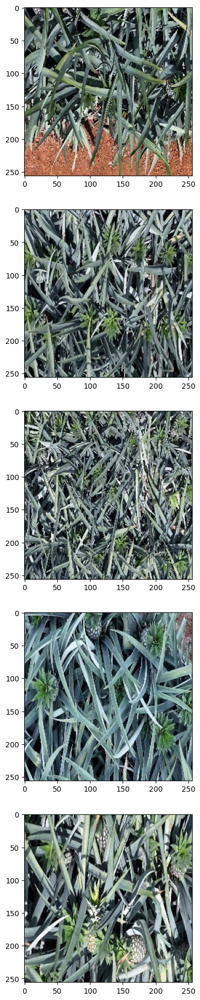

In [5]:
import matplotlib.pyplot as plt
trainset = PineappleDataset(train=True, train_ratio=0.8)
#trainset = CustomCIFARDataset(train=True, train_ratio=0.8)

fig=plt.figure(figsize=(24, 24))
columns = 1
rows = 5
for i in range(rows):
  batch = trainset[np.random.randint(len(trainset))]
  img = batch['image'].transpose((1,2,0))
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  fig.add_subplot(rows, columns, i*columns+1)
  plt.imshow(img)
plt.show()

Test with MSE pixel level, KL Beta 0.6

In [2]:
import torch
import numpy as np
import cv2
from VAE import VAE  # Make sure VAE is correctly imported from your VAE.py

# 1. Load the trained VAE checkpoint
model = VAE()
checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae/betaKL@1.0/weights_ck_18.pt"  # Replace with your checkpoint file
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)
model.eval()
model.cuda()  # Move model to GPU if available

index = 3
test_set = PineappleDataset(train=False, train_ratio=0.8)
# 2. Load the test image
test_image = test_set[index]['image']
test_image = torch.tensor(test_image).unsqueeze(0).cuda()  # Add batch dimension and move to GPU
# 3. Pass the image through the model
with torch.no_grad():
    reconstructed_image, _, _ = model(test_image)
    reconstructed_image = reconstructed_image.squeeze(0).cpu().numpy()  # Remove batch dimension and move to CPU
    reconstructed_image = np.transpose(reconstructed_image, (1, 2, 0))  # Change to HWC format
    reconstructed_image = (reconstructed_image)  # Convert to uint8
# 4. Display the original and reconstructed images
fig = plt.figure(figsize=(12, 6))
columns = 2
rows = 1
original_image = test_set[index]['image'].transpose((1, 2, 0))
original_image = (original_image * 255).astype(np.uint8)  # Convert to uint8
# add labels to the images
fig.add_subplot(rows, columns, 1, title='Original Image')
plt.imshow(original_image)
fig.add_subplot(rows, columns, 2, title='Reconstructed Image')
plt.imshow(reconstructed_image)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae/betaKL@1.0/weights_ck_18.pt'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007834824..0.79490304].


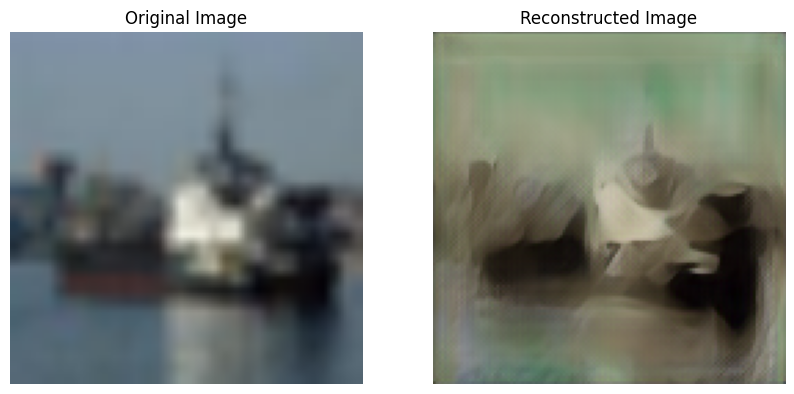

In [19]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from VAE import VAE  # Make sure VAE is defined correctly
from torchvision import datasets, transforms

# Define CIFAR-compatible dataset
class CustomCIFARDataset(torch.utils.data.Dataset):
    def __init__(self, train=True, train_ratio=0.8):
        self.transform = transforms.Compose([
            transforms.Resize((128, 128)),
            transforms.ToTensor(),  # [C, H, W] and normalized to [0, 1]
        ])
        full_dataset = datasets.CIFAR10(root='./data', train=True, download=True)
        split_index = int(len(full_dataset) * train_ratio)
        if train:
            self.data = full_dataset.data[:split_index]
            self.targets = full_dataset.targets[:split_index]
        else:
            self.data = full_dataset.data[split_index:]
            self.targets = full_dataset.targets[split_index:]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = self.data[idx]
        label = self.targets[idx]
        image = transforms.ToPILImage()(image)
        image = self.transform(image)
        return {'image': image, 'label': label, 'idx': idx}

# 1. Load the trained VAE checkpoint
model = VAE()
checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae/betaKL@1.0/weights_ck_18.pt"  # Replace with your checkpoint path
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 2. Load CIFAR test sample
test_set = CustomCIFARDataset(train=False, train_ratio=0.8)
test_sample = test_set[1]
test_image = test_sample['image'].unsqueeze(0).to(device)  # Add batch dimension

# 3. Forward pass through the model
with torch.no_grad():
    reconstructed_image, _, _ = model(test_image)
    reconstructed_image = reconstructed_image.squeeze(0).cpu().numpy()
    reconstructed_image = np.transpose(reconstructed_image, (1, 2, 0))  # [H, W, C]
    reconstructed_image = reconstructed_image 

# 4. Original image
original_image = test_sample['image'].cpu().numpy()
original_image = np.transpose(original_image, (1, 2, 0))  # [H, W, C]
original_image = (original_image * 255).astype(np.uint8)

# 5. Display original vs reconstructed image
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1, title='Original Image')
plt.imshow(original_image)
plt.axis('off')
fig.add_subplot(1, 2, 2, title='Reconstructed Image')
plt.imshow(reconstructed_image)
plt.axis('off')
plt.show()


In [20]:
import torch

# Example: Create a random latent vector from the encoder's output (e.g., (Batch_Size, 4, Height / 8, Width / 8))
batch_size = 8
height, width = 128, 128
latent = torch.randn(batch_size, 4, height // 8, width // 8).cuda()  # Random tensor representing the latent space

# Initialize the VAE decoder
decoder = model.decoder

# Pass the latent vector through the decoder to get the reconstructed image
reconstructed_image = decoder(latent)

print(f"Reconstructed image shape: {reconstructed_image.shape}")

Reconstructed image shape: torch.Size([8, 3, 128, 128])


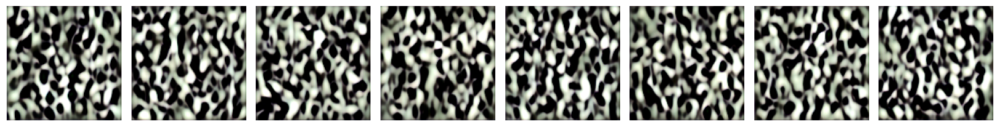

In [21]:
import matplotlib.pyplot as plt
import torch

# Your code
batch_size = 8
height, width = 128, 128
latent = torch.randn(batch_size, 4, height // 8, width // 8).cuda()

decoder = model.decoder
reconstructed_image = decoder(latent)

# Move tensor to CPU and clamp values (for visualization)
reconstructed_image = reconstructed_image.detach().cpu().clamp(0, 1)

# Plot the images
n_images = min(batch_size, 8)  # Plot up to 8 images
fig, axes = plt.subplots(1, n_images, figsize=(15, 3))
for i in range(n_images):
    img = reconstructed_image[i].permute(1, 2, 0)  # CHW -> HWC
    axes[i].imshow(img)
    axes[i].axis("off")
plt.tight_layout()
plt.show()


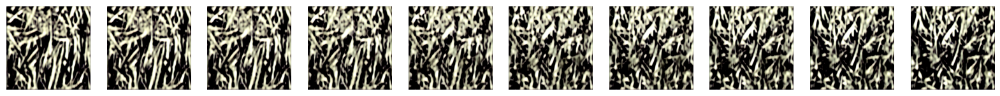

In [24]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from VAE import VAE

# Load the trained VAE model
model = VAE()
checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae/betaKL@1.0/weights_ck_18.pt"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)
model.eval()
model.cuda()

# Load two test images
index1 = 3
index2 = 10
test_set = PineappleDataset(train=False, train_ratio=0.8)
img1 = test_set[index1]['image']
img2 = test_set[index2]['image']

# Preprocess images
img1 = torch.tensor(img1).unsqueeze(0).cuda()
img2 = torch.tensor(img2).unsqueeze(0).cuda()

# Encode both images to latent space
with torch.no_grad():
    _, mu1, _ = model(img1)
    _, mu2, _ = model(img2)

# Interpolate between the two latent vectors
num_steps = 10
alphas = torch.linspace(0, 1, steps=num_steps).cuda()

interpolated_images = []
with torch.no_grad():
    for alpha in alphas:
        z_interp = (1 - alpha) * mu1 + alpha * mu2
        recon = model.decoder(z_interp)
        recon = recon.squeeze(0).cpu().numpy()
        recon = np.transpose(recon, (1, 2, 0))
        recon = np.clip(recon * 255, 0, 255).astype(np.uint8)
        interpolated_images.append(recon)

# Visualize the interpolation
fig = plt.figure(figsize=(20, 4))
for i, img in enumerate(interpolated_images):
    ax = fig.add_subplot(1, num_steps, i + 1)
    ax.imshow(img)
    ax.axis('off')
#plt.suptitle('Latent Space Interpolation')
plt.show()


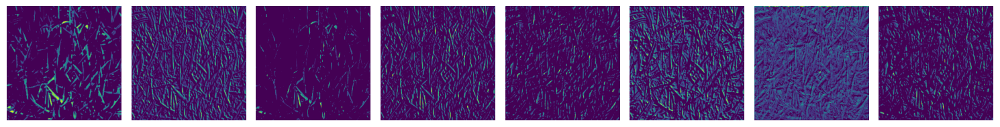

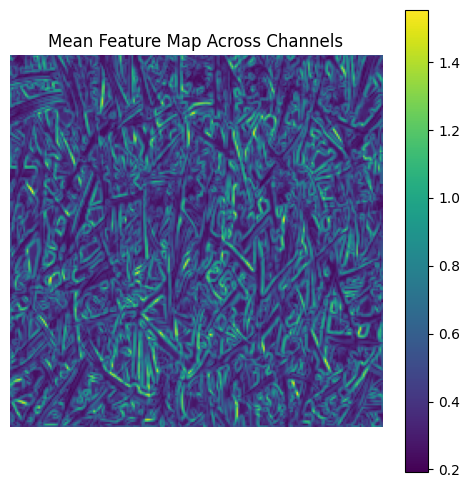

In [17]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load the pretrained VGG19 model
vgg19 = models.vgg19(pretrained=True).features.eval()

# Choose the target layer index (e.g., 5 corresponds to relu1_2)
target_layer = 1  # You can change this

# Load and preprocess the image
img = Image.open("/home/rtxmsi1/Documents/VAE_training-master/FULL_VERTICAL_PINEAPPLE/FULL_UNIFIED/0a1afa9c95914b5c8a9022363f4364c0.png").convert("RGB")
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])
input_tensor = transform(img).unsqueeze(0)

# Feature map container
feature_maps = []

# Hook for the target layer
def hook_fn(module, input, output):
    feature_maps.append(output)

# Register hook
hook = vgg19[target_layer].register_forward_hook(hook_fn)

# Forward pass
with torch.no_grad():
    _ = vgg19(input_tensor)

# Remove hook
hook.remove()
# Plot the mean across channels
def plot_mean_feature_map(fmaps):
    fmap = fmaps[0].squeeze(0)  # Shape: (C, H, W)
    mean_fmap = fmap.mean(dim=0).cpu()  # Shape: (H, W)

    plt.figure(figsize=(6, 6))
    plt.imshow(mean_fmap, cmap='viridis')
    plt.title("Mean Feature Map Across Channels")
    plt.axis('off')
    plt.colorbar()
    plt.show()

# Plotting function
def plot_feature_maps(fmaps, num_channels=8):
    fmap = fmaps[0].squeeze(0)  # Remove batch dimension
    n = min(num_channels, fmap.size(0))
    plt.figure(figsize=(15, 15))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(fmap[i].cpu(), cmap='viridis')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Plot
plot_feature_maps(feature_maps)
plot_mean_feature_map(feature_maps)


In [13]:
import torchvision.models as models

# Load pretrained VGG19 model
vgg19 = models.vgg19(pretrained=True)

# Access feature layers
features = vgg19.features

# Count and display
layer_counts = {}
print("Index\tLayer Type")
print("-" * 25)
for idx, layer in enumerate(features):
    layer_type = layer.__class__.__name__
    print(f"{idx}\t{layer_type}")
    layer_counts[layer_type] = layer_counts.get(layer_type, 0) + 1

# Summary
print("\nLayer Count Summary:")
for k, v in layer_counts.items():
    print(f"{k}: {v}")


Index	Layer Type
-------------------------
0	Conv2d
1	ReLU
2	Conv2d
3	ReLU
4	MaxPool2d
5	Conv2d
6	ReLU
7	Conv2d
8	ReLU
9	MaxPool2d
10	Conv2d
11	ReLU
12	Conv2d
13	ReLU
14	Conv2d
15	ReLU
16	Conv2d
17	ReLU
18	MaxPool2d
19	Conv2d
20	ReLU
21	Conv2d
22	ReLU
23	Conv2d
24	ReLU
25	Conv2d
26	ReLU
27	MaxPool2d
28	Conv2d
29	ReLU
30	Conv2d
31	ReLU
32	Conv2d
33	ReLU
34	Conv2d
35	ReLU
36	MaxPool2d

Layer Count Summary:
Conv2d: 16
ReLU: 16
MaxPool2d: 5


Layer 0: Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


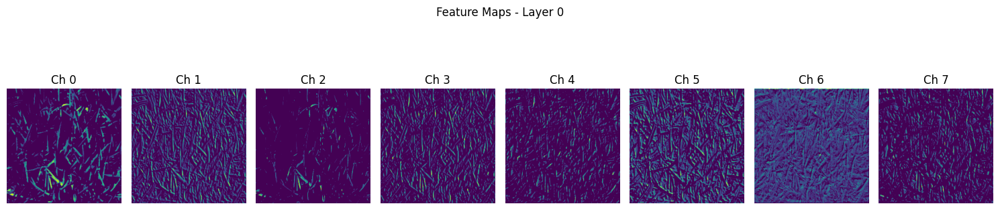

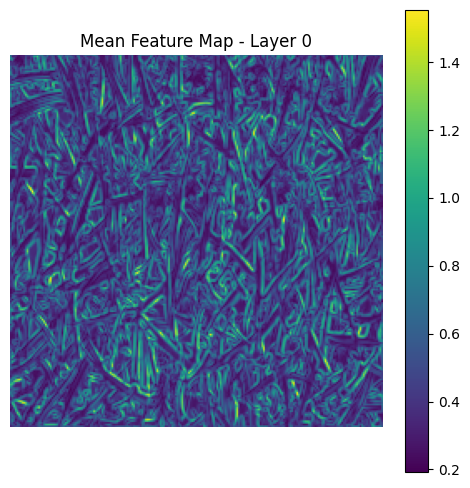

Layer 1: ReLU(inplace=True)


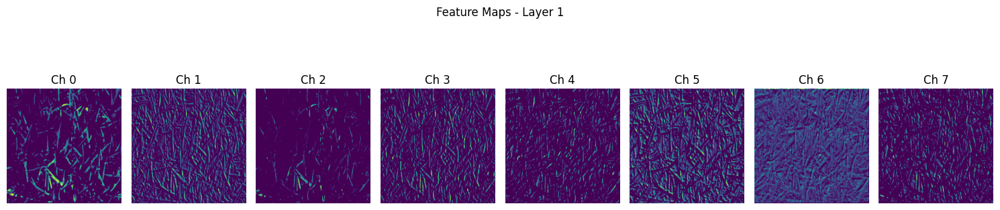

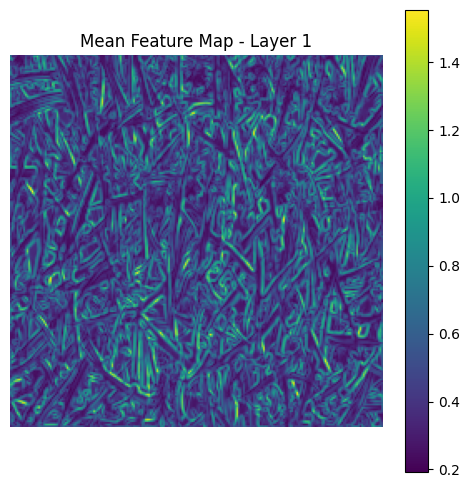

Layer 2: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


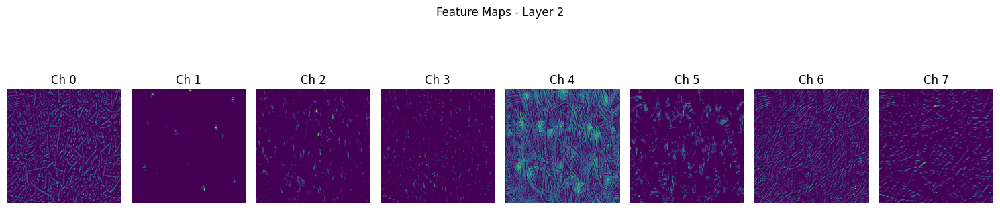

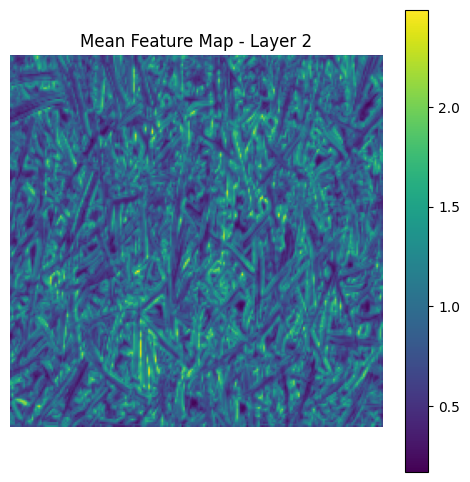

Layer 3: ReLU(inplace=True)


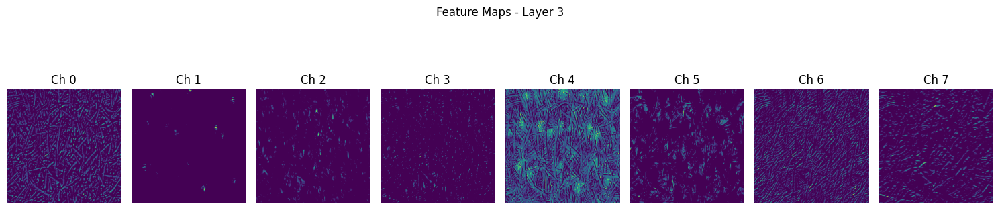

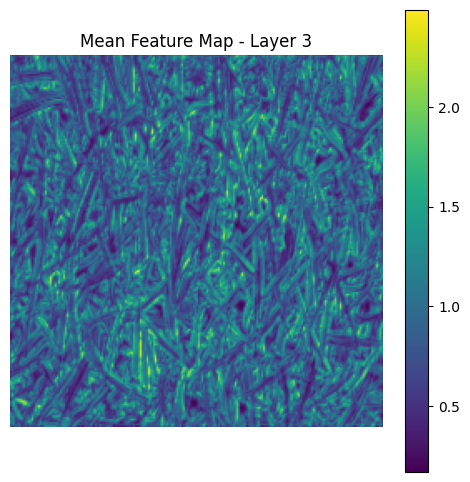

Layer 4: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


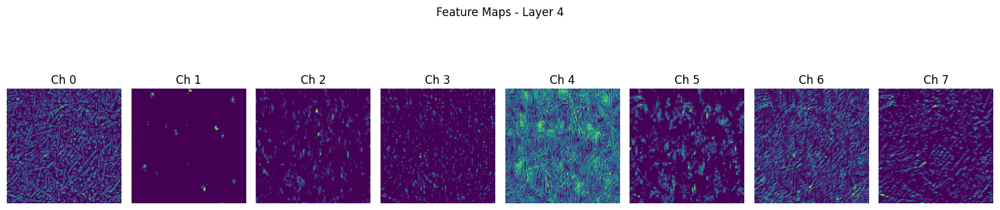

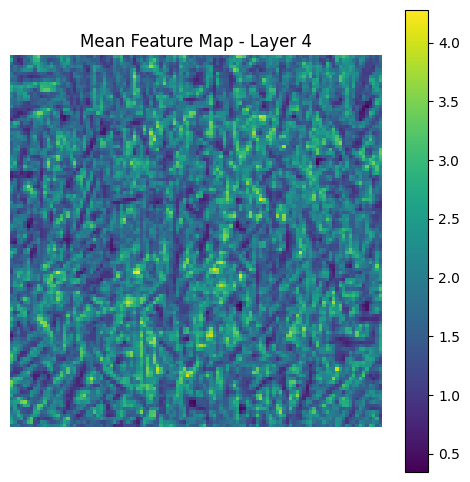

Layer 5: Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


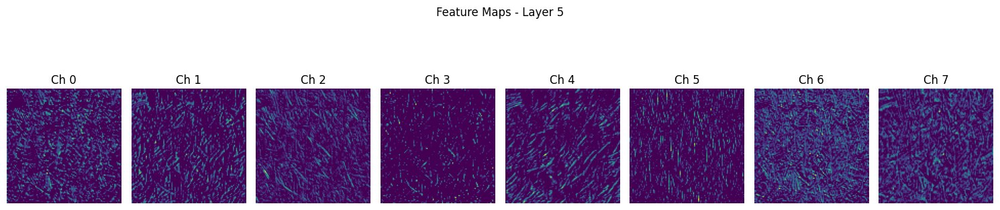

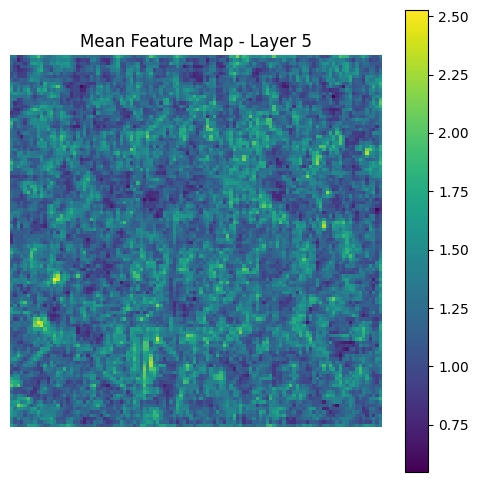

Layer 6: ReLU(inplace=True)


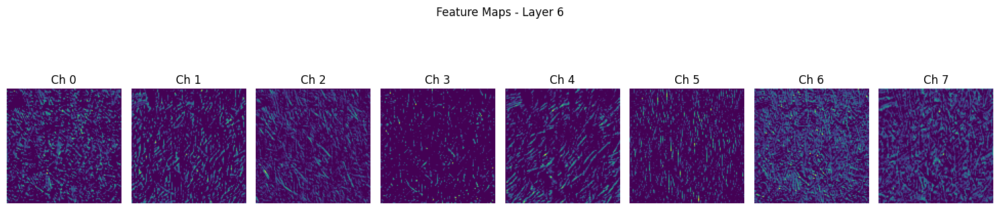

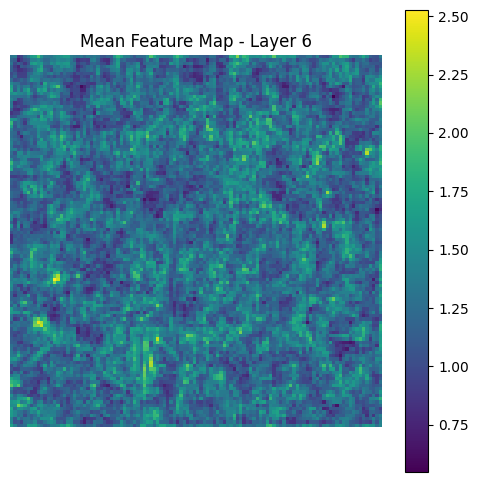

Layer 7: Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


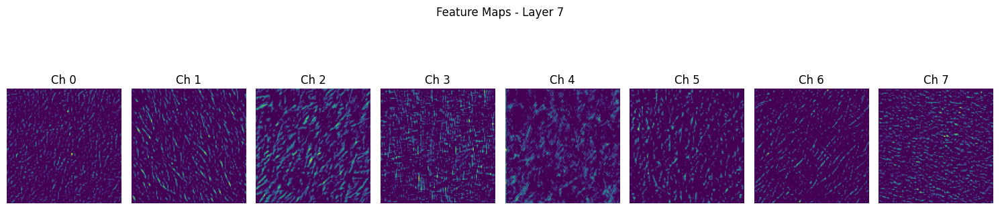

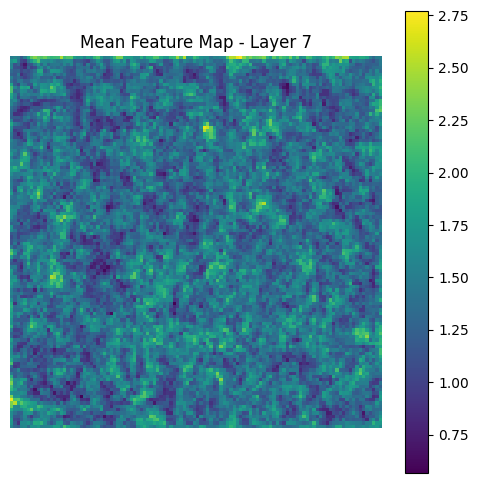

Layer 8: ReLU(inplace=True)


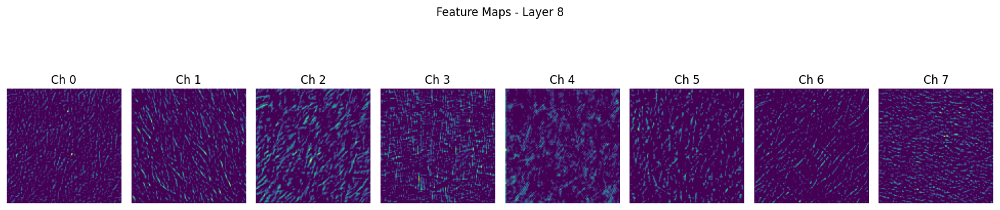

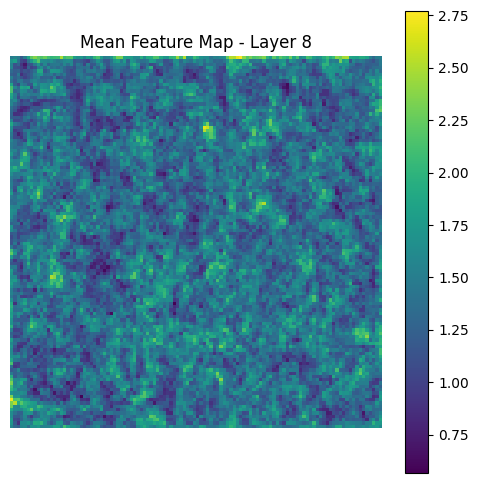

Layer 9: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


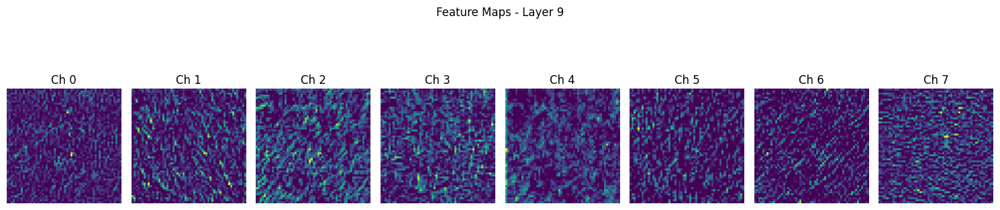

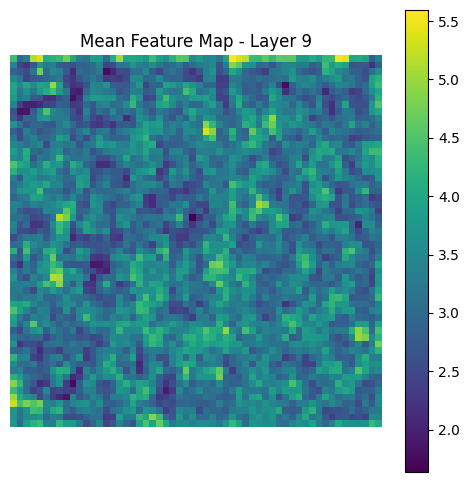

Layer 10: Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


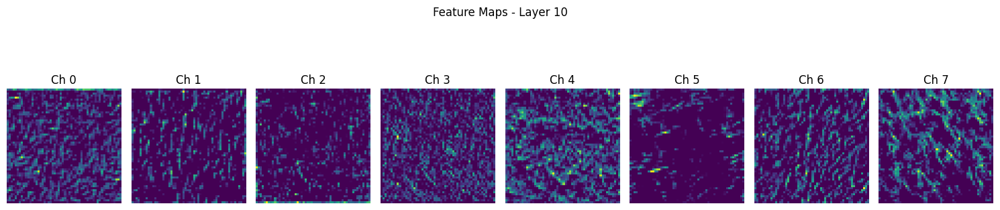

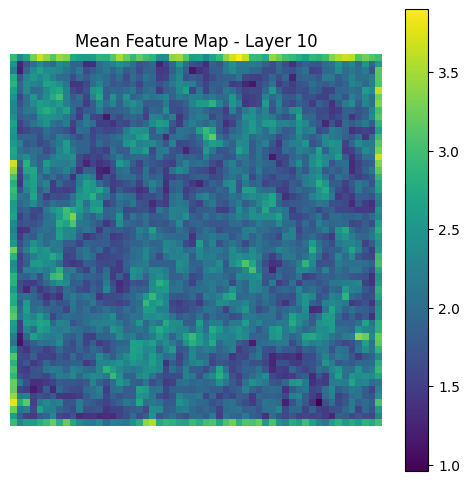

Layer 11: ReLU(inplace=True)


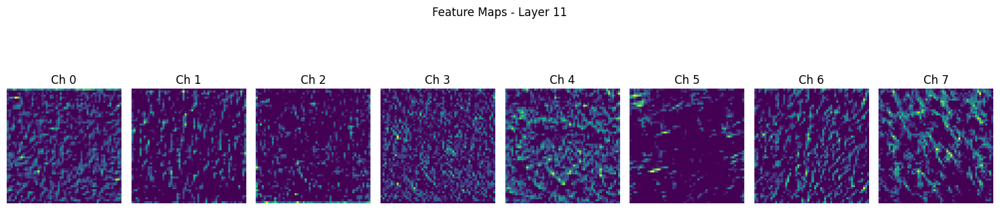

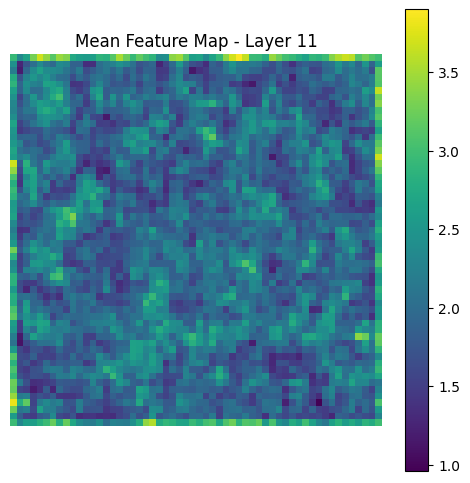

Layer 12: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


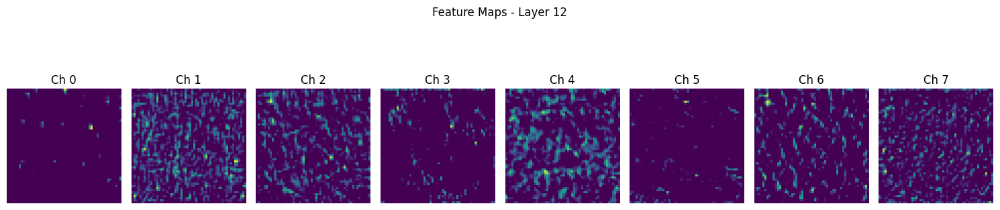

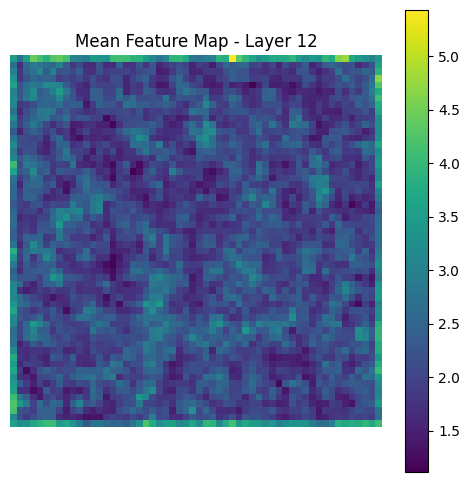

Layer 13: ReLU(inplace=True)


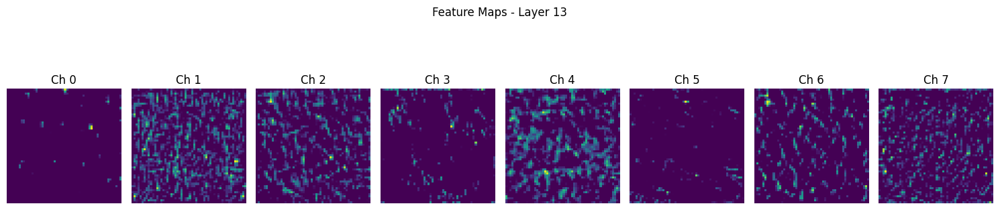

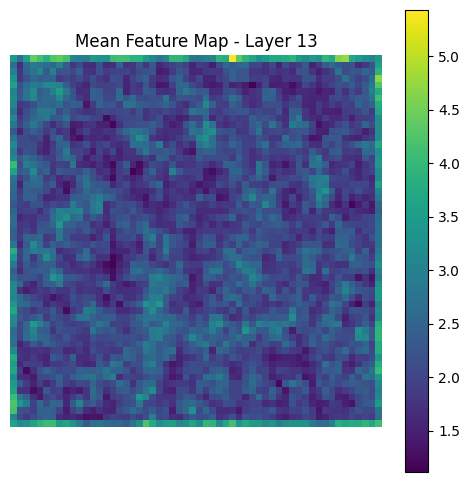

Layer 14: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


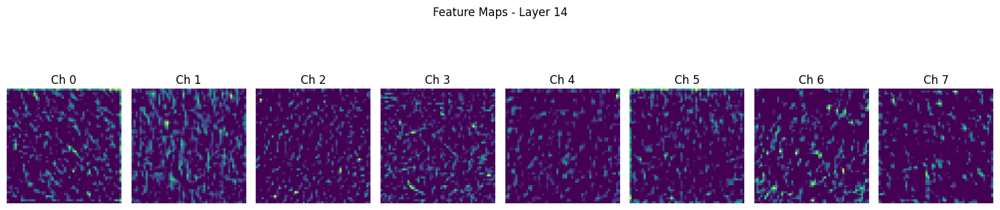

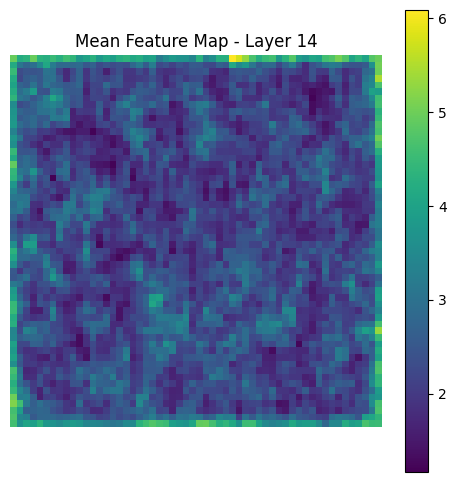

Layer 15: ReLU(inplace=True)


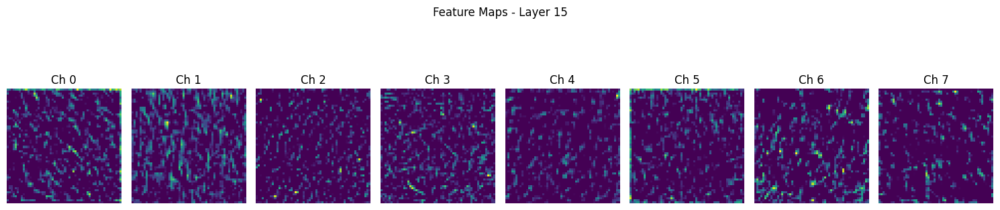

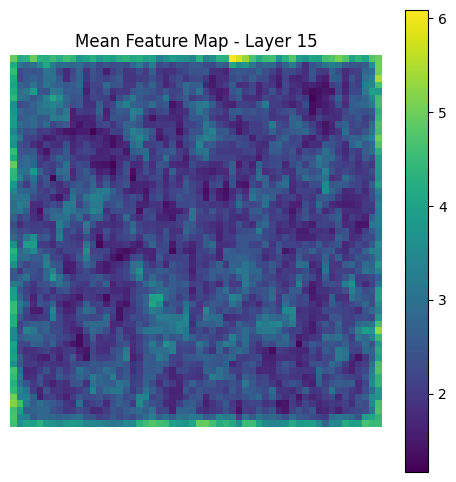

Layer 16: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


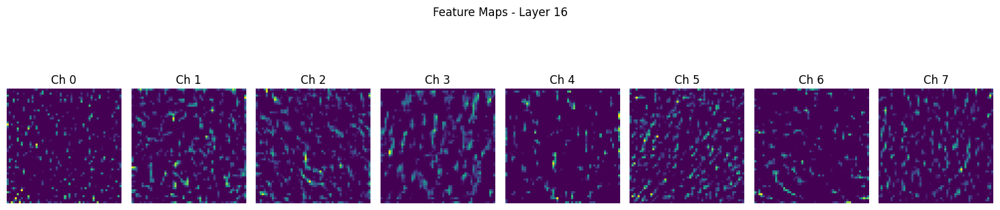

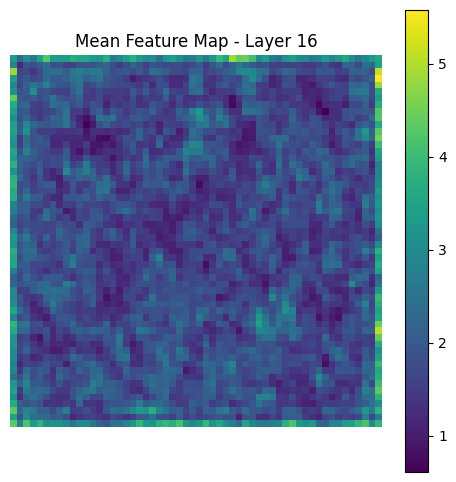

Layer 17: ReLU(inplace=True)


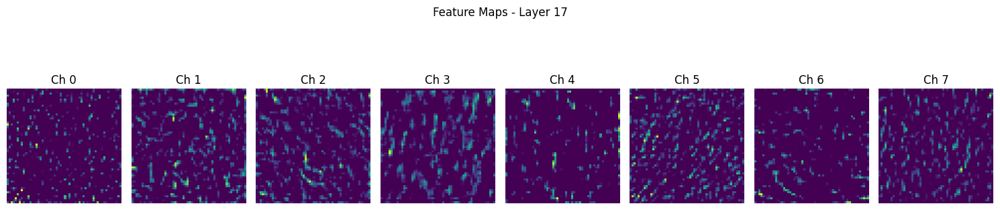

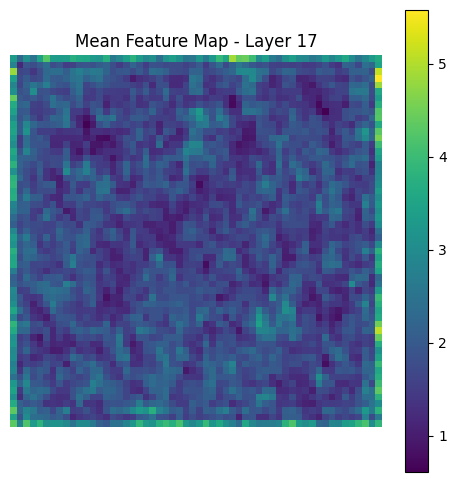

Layer 18: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


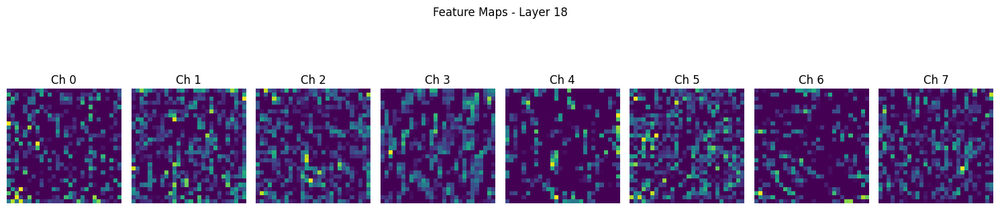

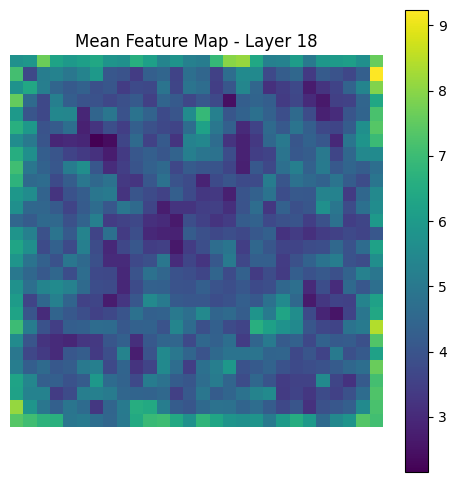

Layer 19: Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


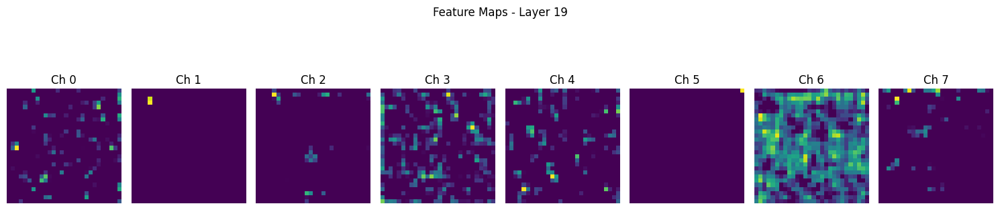

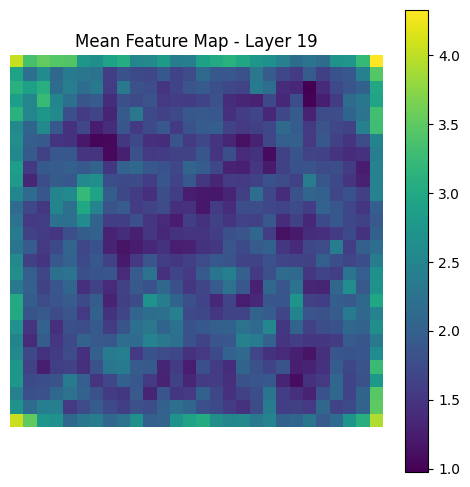

Layer 20: ReLU(inplace=True)


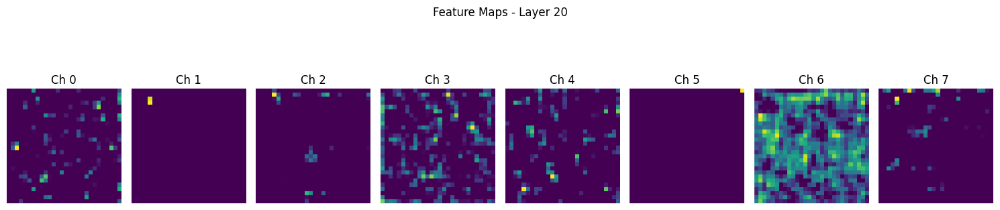

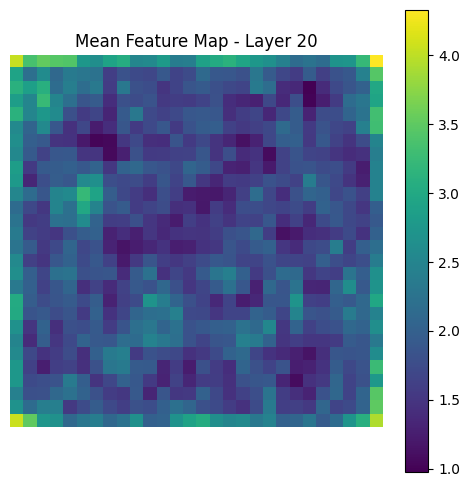

Layer 21: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


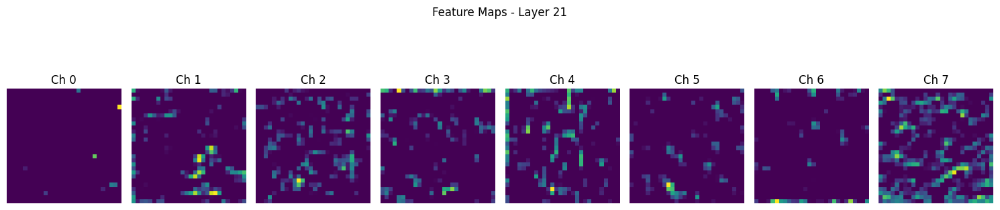

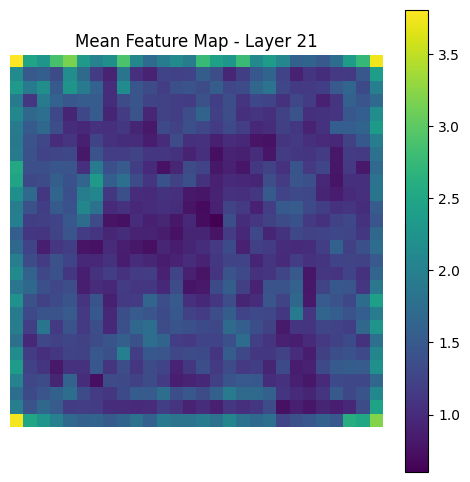

Layer 22: ReLU(inplace=True)


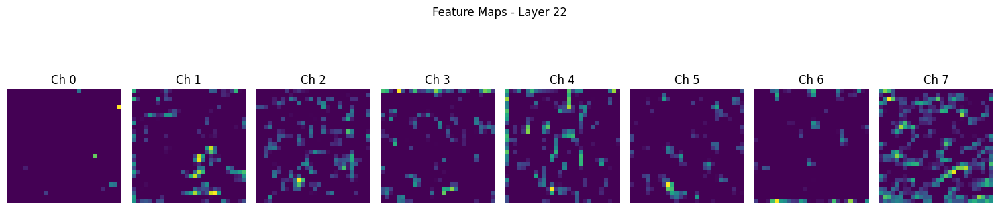

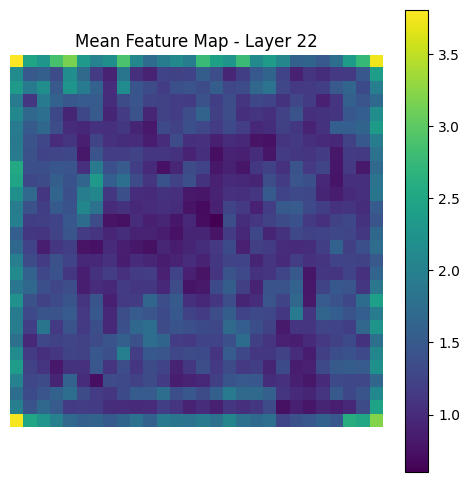

Layer 23: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


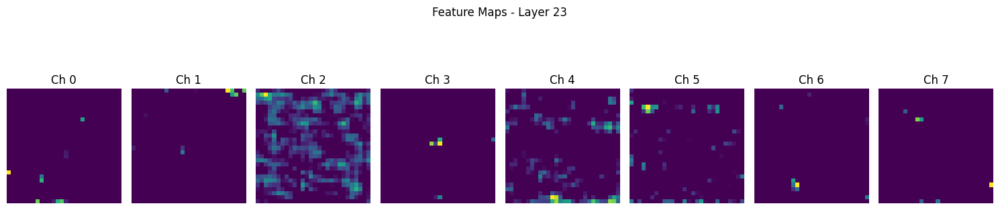

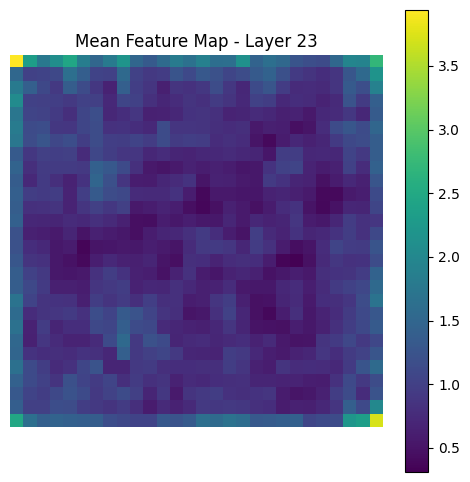

Layer 24: ReLU(inplace=True)


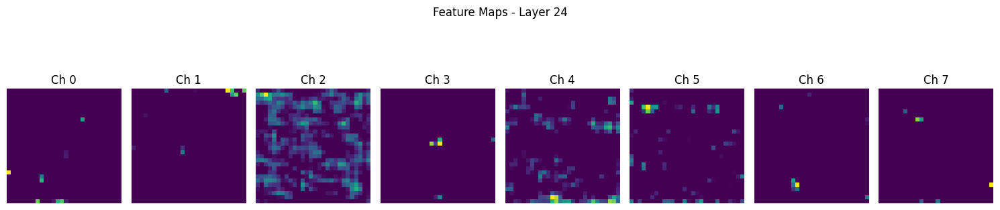

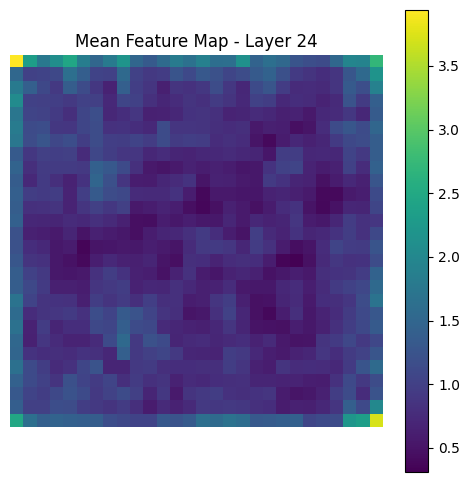

Layer 25: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


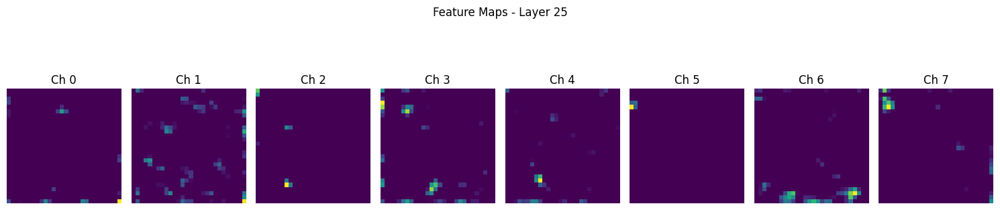

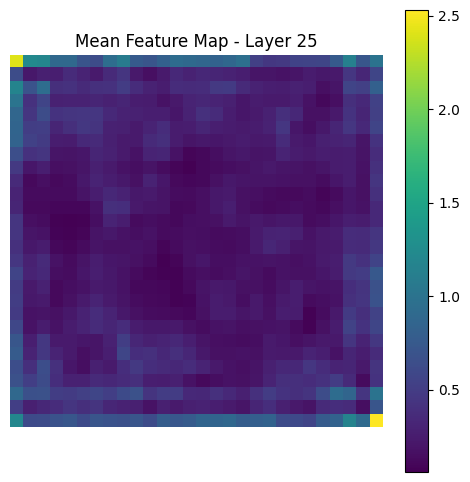

Layer 26: ReLU(inplace=True)


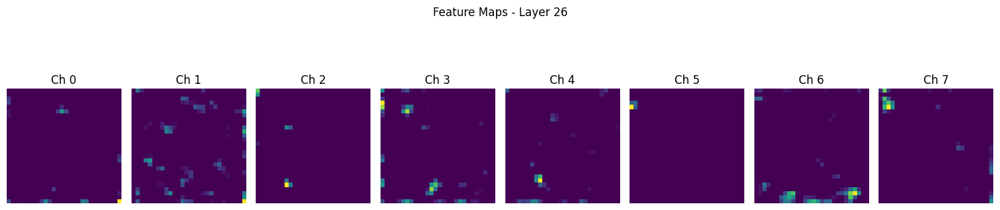

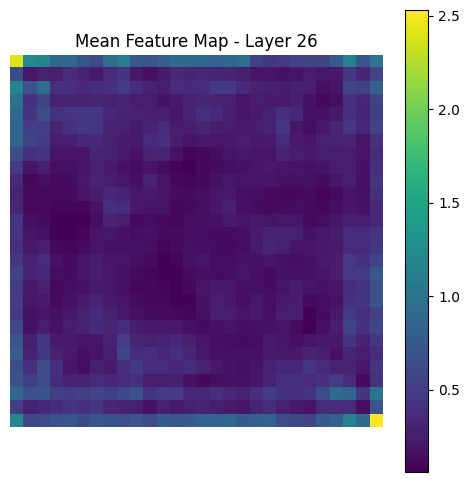

Layer 27: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


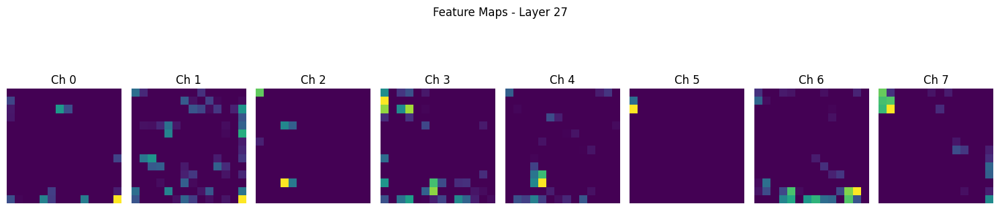

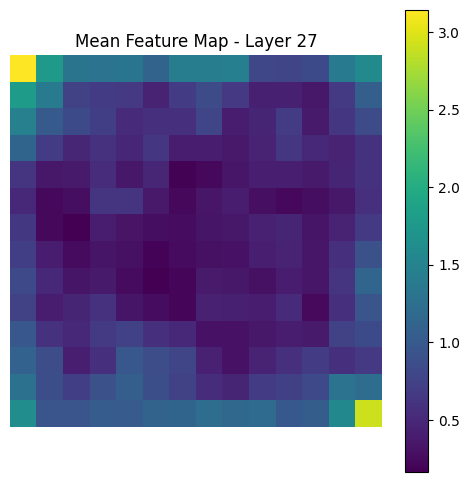

Layer 28: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


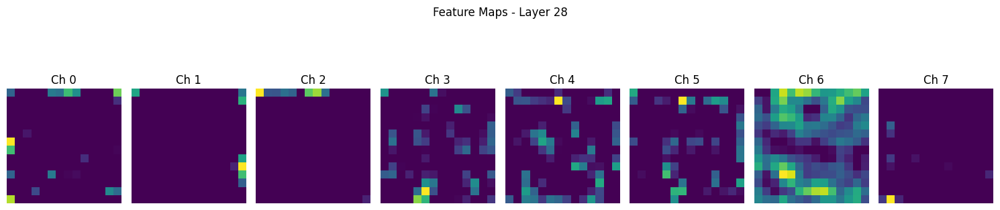

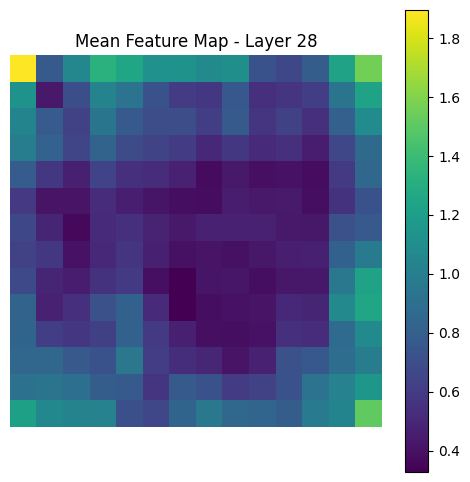

Layer 29: ReLU(inplace=True)


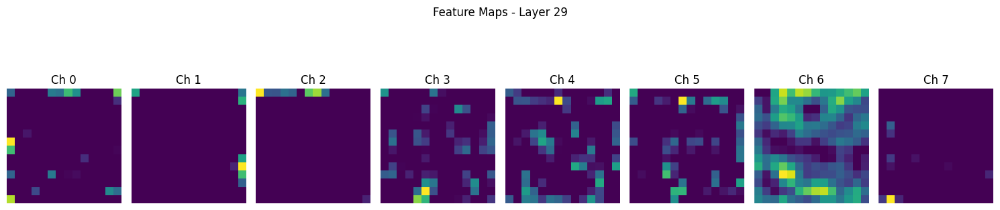

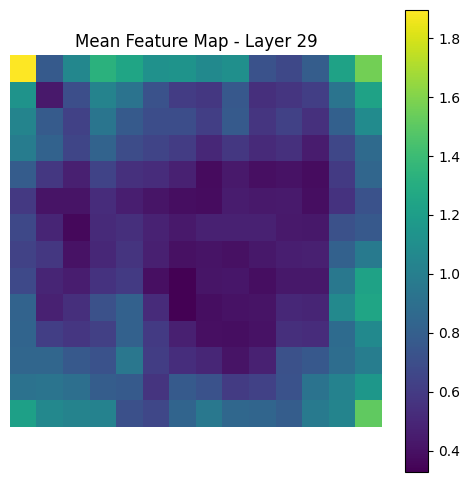

Layer 30: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


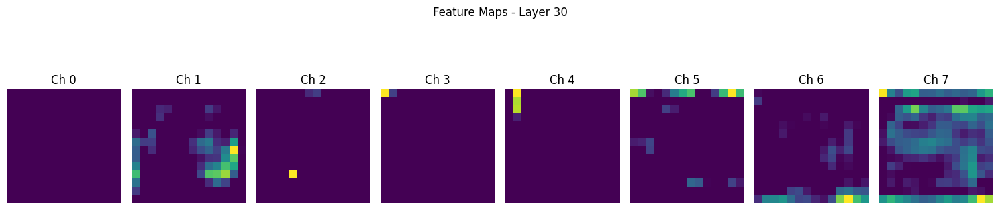

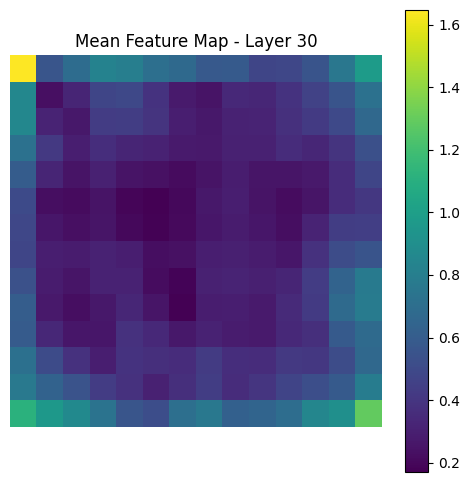

Layer 31: ReLU(inplace=True)


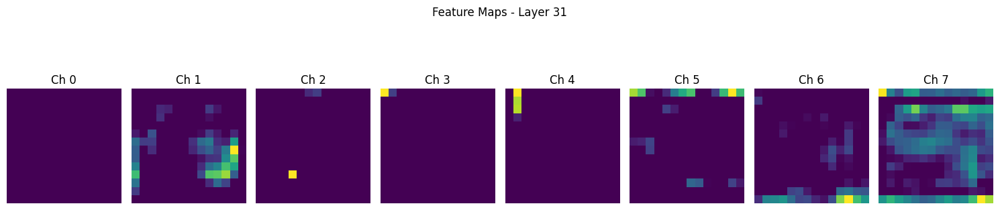

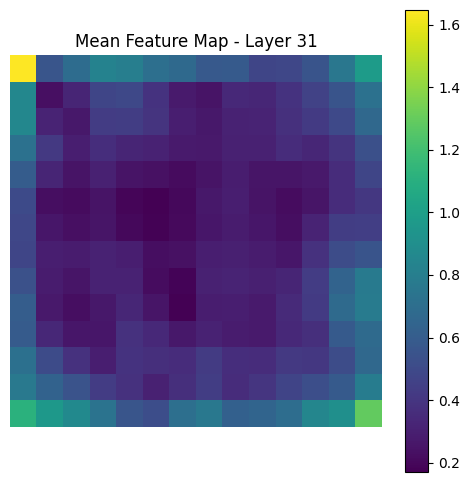

Layer 32: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


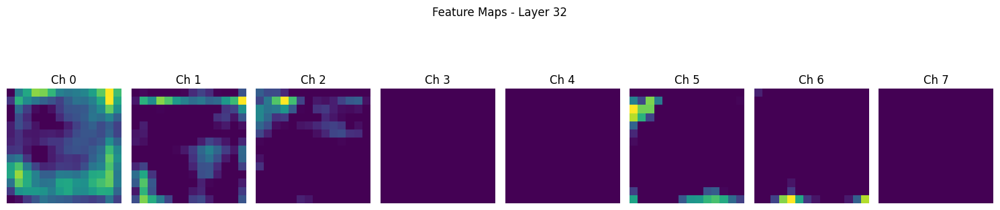

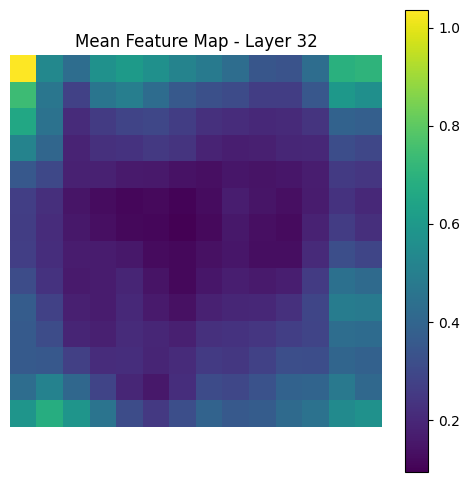

Layer 33: ReLU(inplace=True)


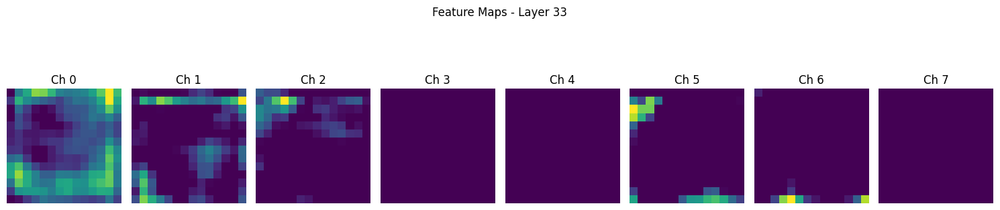

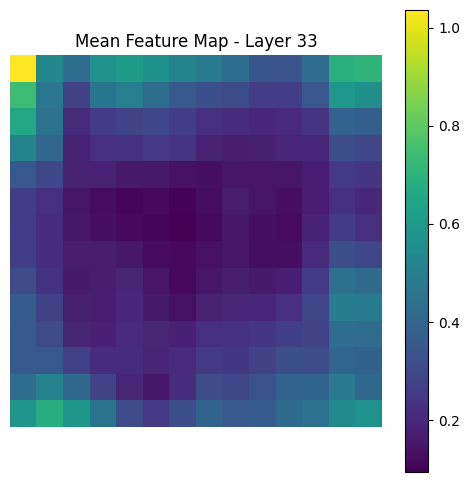

Layer 34: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


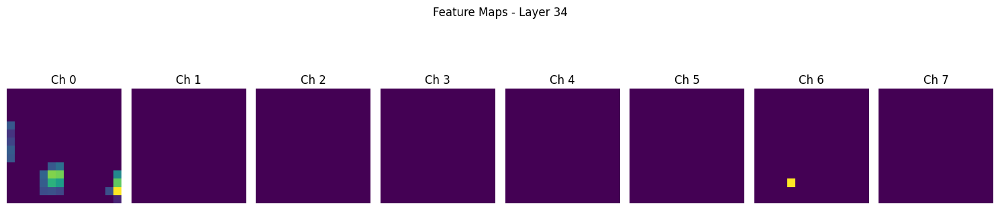

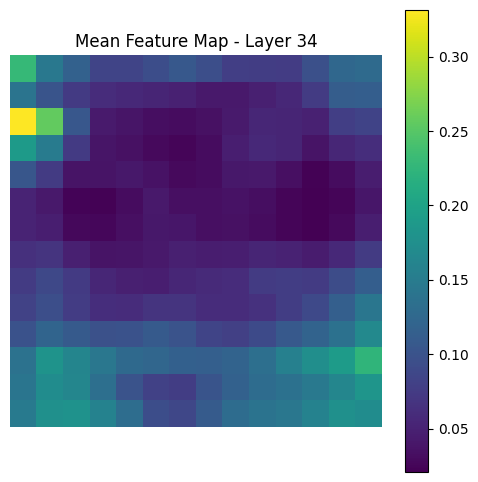

Layer 35: ReLU(inplace=True)


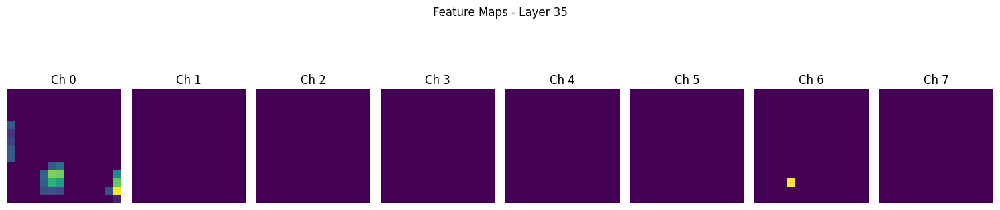

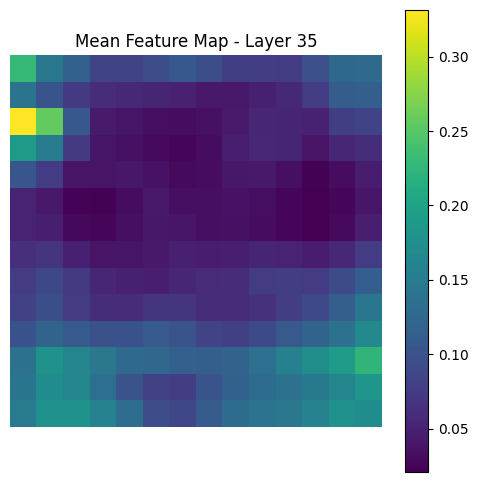

Layer 36: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)


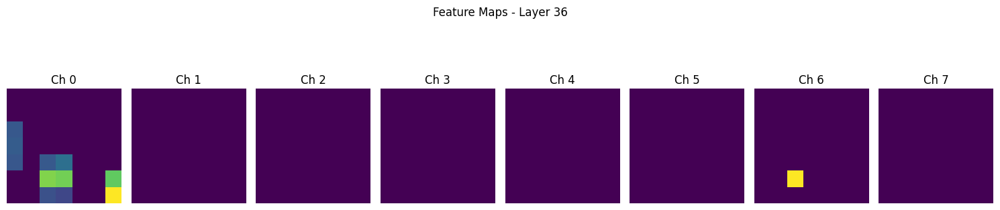

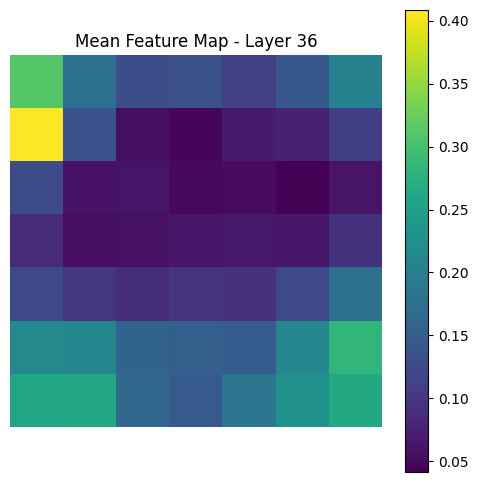

In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load the pretrained VGG19 model
vgg19 = models.vgg19(pretrained=True).features.eval()

# Load and preprocess the image
img = Image.open("/home/rtxmsi1/Documents/VAE_training-master/FULL_VERTICAL_PINEAPPLE/FULL_UNIFIED/0a1afa9c95914b5c8a9022363f4364c0.png").convert("RGB")
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
input_tensor = transform(img).unsqueeze(0)

# Plotting functions
def plot_feature_maps(fmaps, layer_idx, num_channels=8):
    fmap = fmaps.squeeze(0)
    n = min(num_channels, fmap.size(0))
    plt.figure(figsize=(15, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(fmap[i].cpu(), cmap='viridis')
        plt.title(f'Ch {i}')
        plt.axis('off')
    plt.suptitle(f"Feature Maps - Layer {layer_idx}")
    plt.tight_layout()
    plt.show()

def plot_mean_feature_map(fmaps, layer_idx):
    fmap = fmaps.squeeze(0).mean(dim=0).cpu()
    plt.figure(figsize=(6, 6))
    plt.imshow(fmap, cmap='viridis')
    plt.title(f"Mean Feature Map - Layer {layer_idx}")
    plt.axis('off')
    plt.colorbar()
    plt.show()

# Iterate through each layer
for layer_idx in range(len(vgg19)):
    feature_maps = []

    # Define and register hookhome
    hook = vgg19[layer_idx].register_forward_hook(hook_fn)

    # Forward pass
    with torch.no_grad():
        _ = vgg19(input_tensor)

    # Remove hook
    hook.remove()

    # If there are feature maps, plot them
    if feature_maps:
        print(f"Layer {layer_idx}: {vgg19[layer_idx]}")
        plot_feature_maps(feature_maps[0], layer_idx)
        plot_mean_feature_map(feature_maps[0], layer_idx)


64
Loss mean:  tensor(0.4846, device='cuda:0')
Loss sum:  tensor(31.0155, device='cuda:0')
64
Loss mean:  tensor(2.7407, device='cuda:0')
Loss sum:  tensor(175.4040, device='cuda:0')
128
Loss mean:  tensor(5.3984, device='cuda:0')
Loss sum:  tensor(690.9899, device='cuda:0')
128
Loss mean:  tensor(9.4416, device='cuda:0')
Loss sum:  tensor(1208.5200, device='cuda:0')
256
Loss mean:  tensor(18.5457, device='cuda:0')
Loss sum:  tensor(4747.7012, device='cuda:0')
256
Loss mean:  tensor(23.8792, device='cuda:0')
Loss sum:  tensor(6113.0630, device='cuda:0')
256
Loss mean:  tensor(29.3352, device='cuda:0')
Loss sum:  tensor(7509.8096, device='cuda:0')
256
Loss mean:  tensor(30.0950, device='cuda:0')
Loss sum:  tensor(7704.3203, device='cuda:0')
512
Loss mean:  tensor(29.5170, device='cuda:0')
Loss sum:  tensor(15112.6865, device='cuda:0')
512
Loss mean:  tensor(16.3313, device='cuda:0')
Loss sum:  tensor(8361.6113, device='cuda:0')
512
Loss mean:  tensor(8.2514, device='cuda:0')
Loss sum:  

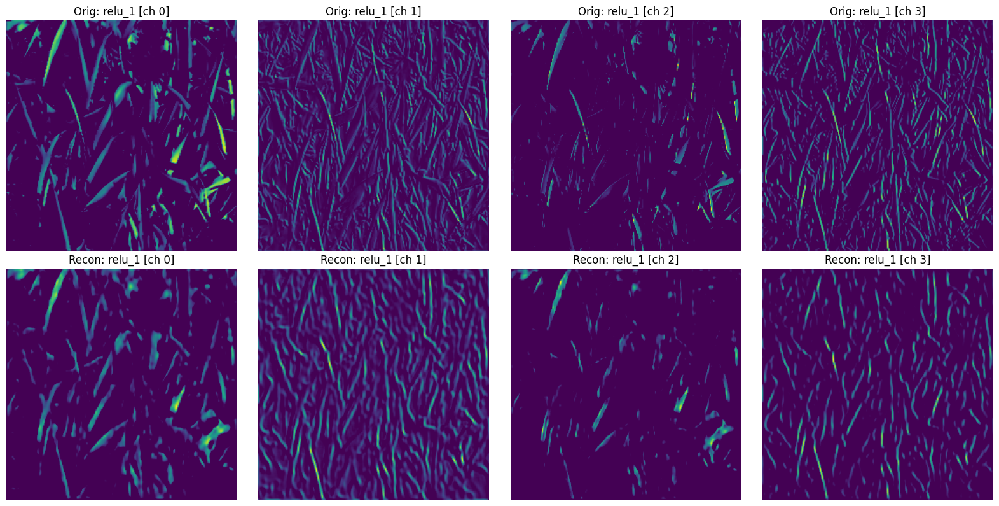

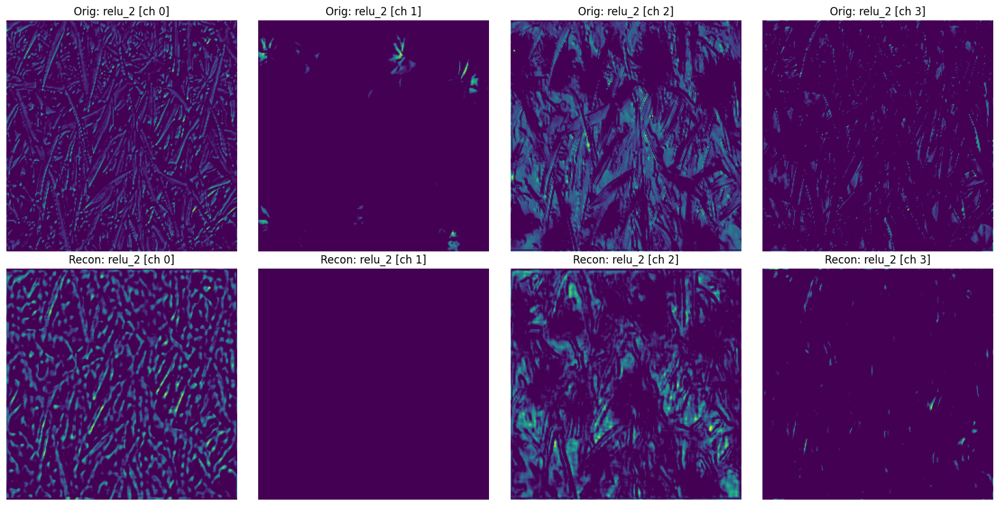

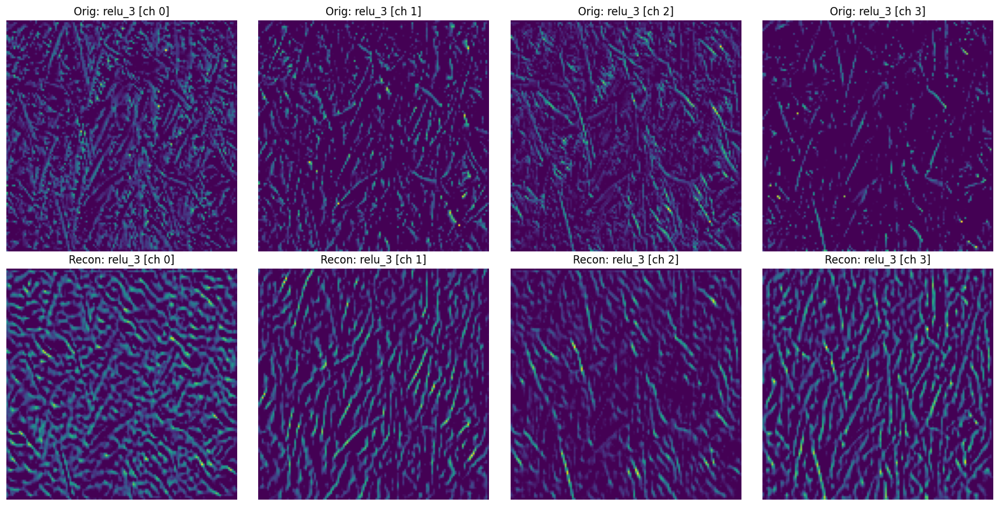

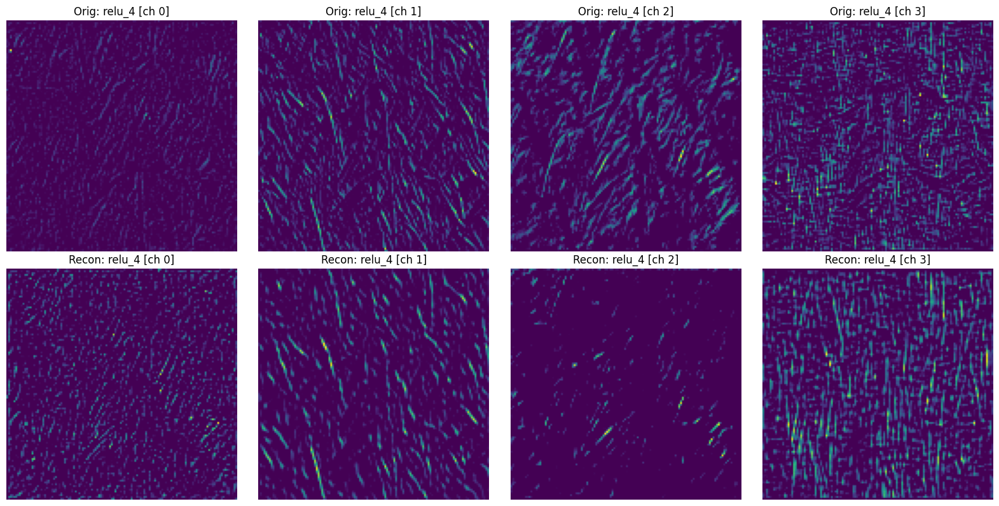

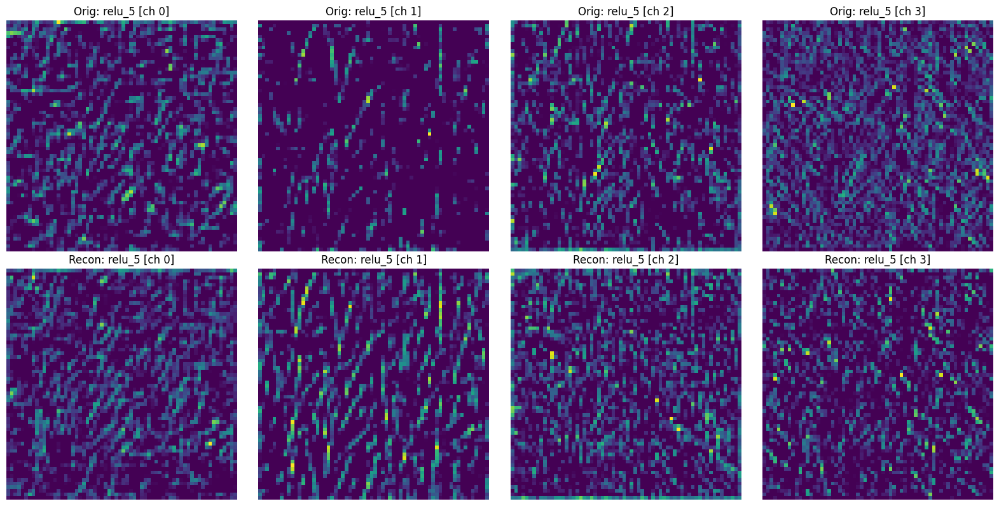

...

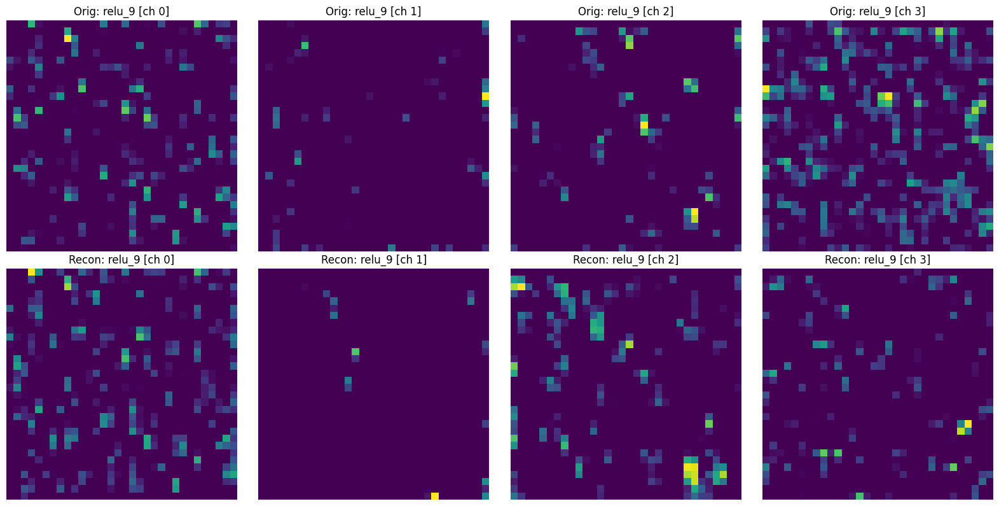

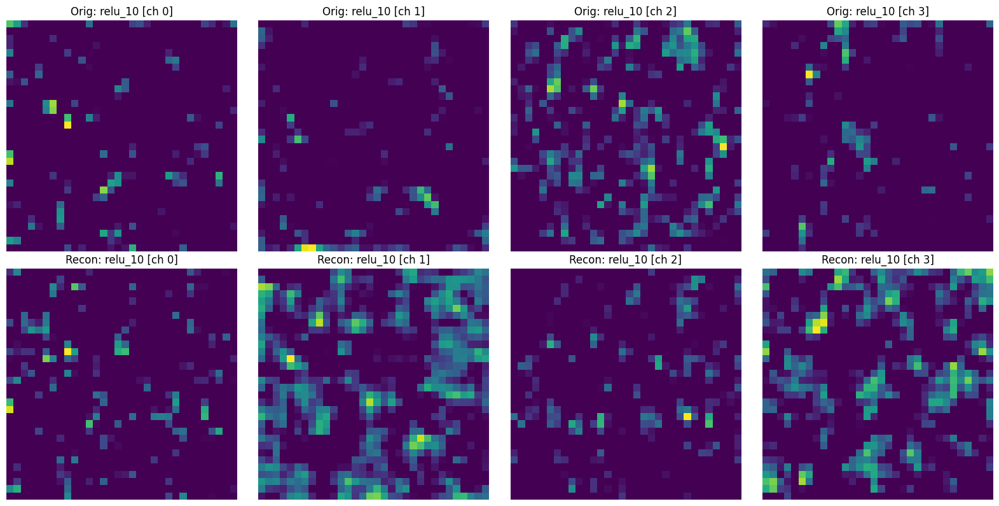

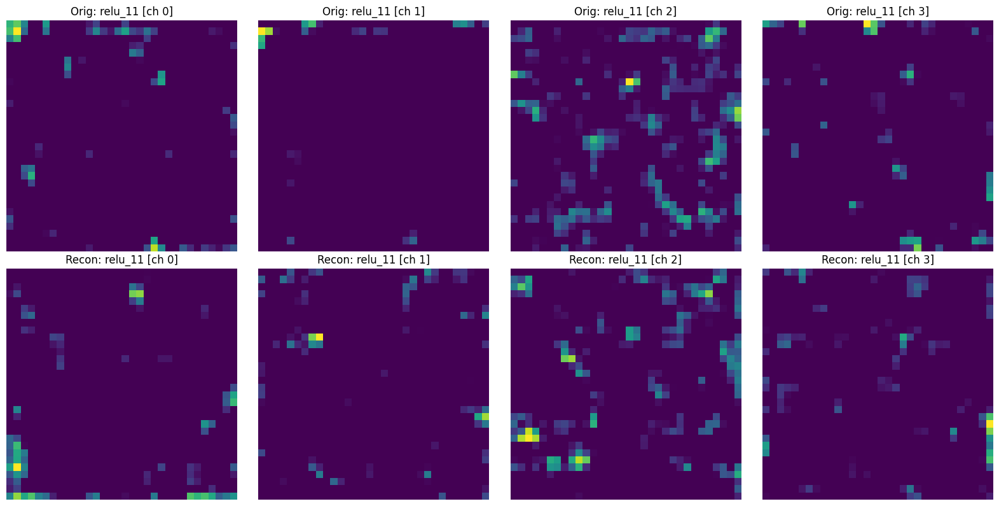

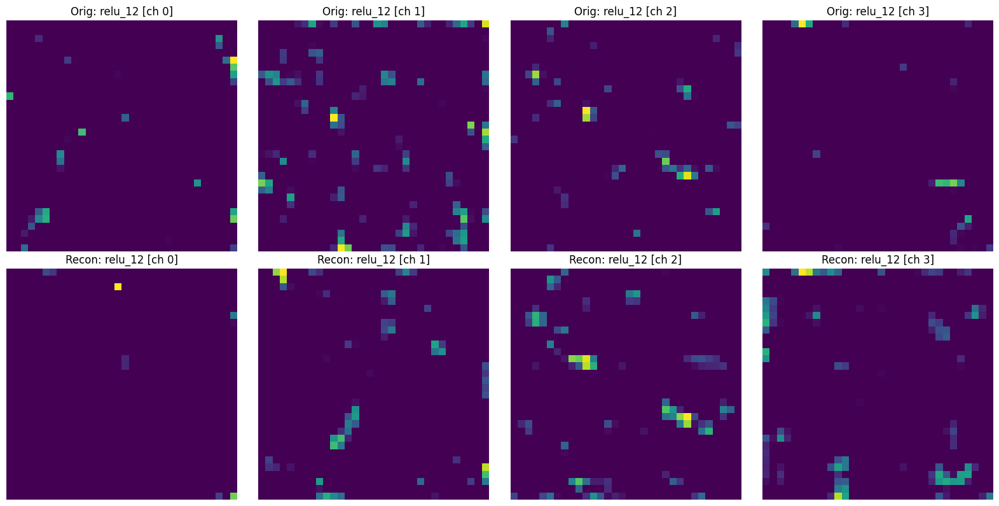

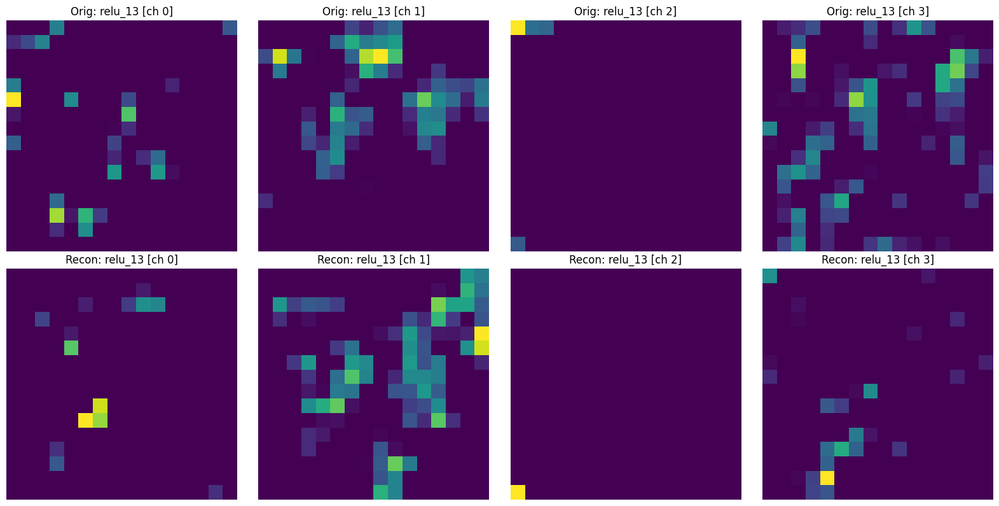

In [14]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import models
import copy
import numpy as np


# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ImageNet normalization for VGG19
imagenet_mean = torch.tensor([0.485, 0.456, 0.406]).to(device).view(1, 3, 1, 1)
imagenet_std = torch.tensor([0.229, 0.224, 0.225]).to(device).view(1, 3, 1, 1)

def normalize_for_vgg(x):
    return (x - imagenet_mean) / imagenet_std

# VGG19 perceptual submodels
def build_vgg_perceptual_model(layers=None):
    if layers is None:
        layers = ['relu_2', 'relu_5', 'relu_13', 'relu_14']

    vgg = models.vgg19(pretrained=True).features.to(device).eval()
    for param in vgg.parameters():
        param.requires_grad = False

    selected_layers = {}
    model = nn.Sequential().to(device)
    relu_count = 0
    conv_count = 0

    for layer in vgg.children():
        if isinstance(layer, nn.Conv2d):
            conv_count += 1
            name = f'conv_{conv_count}'
        elif isinstance(layer, nn.ReLU):
            relu_count += 1
            name = f'relu_{relu_count}'
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f'pool_{relu_count}'
        else:
            continue

        model.add_module(name, layer)
        if name in layers:
            selected_layers[name] = copy.deepcopy(model)
        if len(selected_layers) == len(layers):
            break

    return selected_layers

# Plot feature maps
def plot_feature_maps_side_by_side(feats_orig, feats_recon, title_prefix="Feature Map", max_channels=4):
    for layer_name in feats_orig.keys():
        fmap_orig = feats_orig[layer_name][0]  # First image in batch
        fmap_recon = feats_recon[layer_name][0]
        num_channels = min(fmap_orig.shape[0], max_channels)

        plt.figure(figsize=(4 * num_channels, 8))
        for i in range(num_channels):
            # Original
            plt.subplot(2, num_channels, i + 1)
            plt.imshow(fmap_orig[i].cpu().detach().numpy(), cmap='viridis')
            plt.title(f"Orig: {layer_name} [ch {i}]")
            plt.axis('off')

            # Reconstructed
            plt.subplot(2, num_channels, i + 1 + num_channels)
            plt.imshow(fmap_recon[i].cpu().detach().numpy(), cmap='viridis')
            plt.title(f"Recon: {layer_name} [ch {i}]")
            plt.axis('off')
        plt.tight_layout()
        plt.show()


# === Main: Load model, data, run inference, visualize ===
if __name__ == "__main__":
    # Load trained VAE
    model = VAE()
    checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master-Latent/checkpoints/vae/betaKL@0.0/weights_ck_0.pt"
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint)
    model.eval().to(device)

    # Load test CIFAR sample
    test_set = PineappleDataset(train=False, train_ratio=0.8)
    test_sample = test_set[1]
    test_image = torch.tensor(test_sample['image']).unsqueeze(0).to(device)

    # Reconstruct image via VAE
    with torch.no_grad():
        reconstructed_image, _, _ = model(test_image)

    # Normalize for VGG
    original_norm = normalize_for_vgg(test_image)
    reconstructed_norm = normalize_for_vgg(reconstructed_image)

    # Extract VGG submodels
    perceptual_model = build_vgg_perceptual_model(
        layers=[f'relu_{i}' for i in range(14)]
    )

    # Compute activations
    feats_orig = {}
    feats_recon = {}

    loss_sum_fn = nn.MSELoss(reduction="sum")
    loss_mean_fn = nn.MSELoss()
    for name, submodel in perceptual_model.items():
        with torch.no_grad():
            feats_orig[name] = submodel(original_norm).detach()
            feats_recon[name] = submodel(reconstructed_norm)
            loss_mean = loss_mean_fn(feats_orig[name], feats_recon[name])
            loss_sum = loss_sum_fn(feats_orig[name], feats_recon[name])

            b, c, h, w = feats_recon[name].size()
            print(c)
            print("Loss mean: ", loss_mean)
            print("Loss sum: ", loss_sum/ (h*w))

    # Plot activations
    plot_feature_maps_side_by_side(feats_orig, feats_recon)
    #plot_feature_maps(feats_orig, title_prefix="Original")
    #plot_feature_maps(feats_recon, title_prefix="Reconstructed")

